# Retrieval Results Analysis — Notebook 2

Free-chemistry retrievals with Piette & Madhusudhan (2020) P-T profile.
Posterior mapping shows individual species (log_H2O, log_12CO, log_13CO, log_CH4)
plus derived C/O and 12CO/13CO ratios.


## Retrieval: 2148796

**Piette & Madhusudhan (2020) P-T Profile + Free chemistry**  
Free chemistry: log_H2O, log_12CO, log_13CO, log_CH4  
P-T: T_anchor (1 bar) + 7 monotonic increments dT_1…dT_7 (PCHIP spline)  
Mass/radius: log_M + log_R as free parameters (log_g derived)  
Live points: N=800, ev=0.5, Norm=None, PerChipScale=False  
Two-night fit: Night 1 = 2022-12-31, Night 2 = 2023-01-01


In [4]:
import sys
sys.path.insert(0, '/data2/peng/Recipe_DH_Tau_B')

from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from analysis import (
    plot_ccf, plot_free_chemistry,
    plot_binned_model_vs_data,
    plot_pt_profile_piette,
    _PIETTE_EQUIL_PARAMS_MR,
)
from tasting_analysis import run_ccf_workflow, run_free_chemistry_workflow

# Piette P-T + free chemistry + log_M/log_R
_PIETTE_FREE_PARAMS_MR = [
    'rv_N1', 'rv_N2', 'vsini', 'epsilon', 'log_M', 'log_R',
    'T_anchor', 'dT_1', 'dT_2', 'dT_3', 'dT_4', 'dT_5', 'dT_6', 'dT_7',
    'log_H2O', 'log_12CO', 'log_13CO', 'log_CH4',
]

workpath     = Path('/data2/peng')
retrieval_id = '2148796_N800_ev0.5_NormNone_PerChipScaleFalse'
night        = '2022-12-31'

print('retrieval exists:', (workpath / 'retrievals' / retrieval_id).exists())


retrieval exists: True


### CCF robustness check


Peak SNR = 5.43 at RV = 0.1 km/s
z-score = -0.20


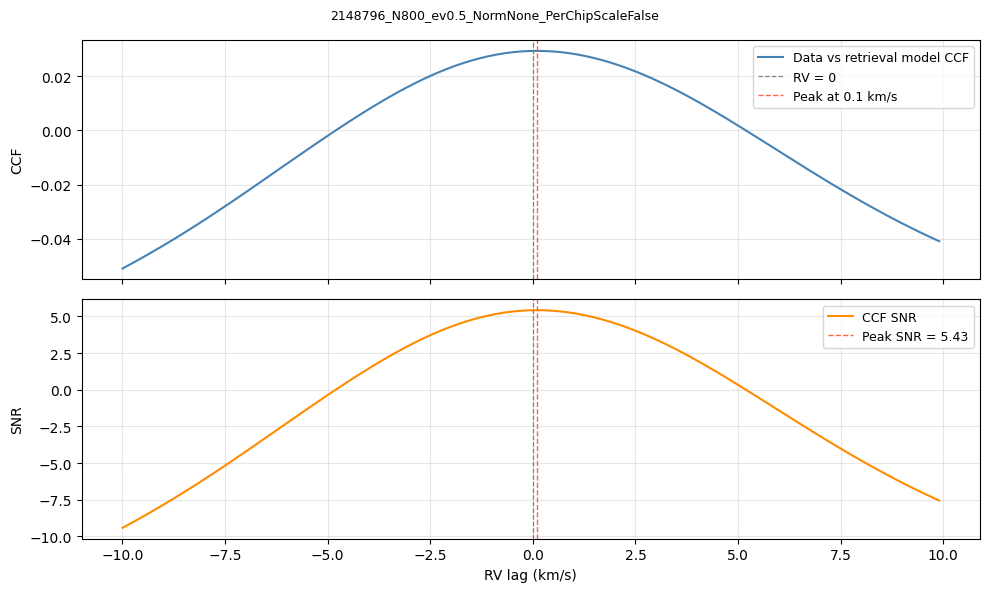

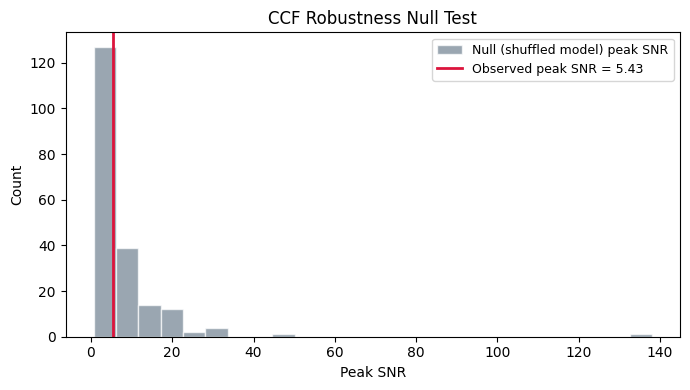

In [5]:
ccf_out = run_ccf_workflow(
    workpath=workpath,
    retrieval_id=retrieval_id,
    night=night,
    rvlag=np.arange(-10, 10, 0.1),
    clean_grids=((-10, -1), (0, 10)),
    n_shuffle=200,
    random_seed=42,
    combined_spectrum_name='extracted_spectra_combined_flux_cal.npy',
)
print(f"Peak SNR = {ccf_out['peak_snr']:.2f} at RV = {ccf_out['peak_rv']:.1f} km/s")
print(f"z-score = {ccf_out['z_score']:.2f}")
plot_ccf(ccf_out, retrieval_id)


### Free chemistry posterior diagnostics (C/O, C/H, 12CO/13CO)


Posterior shape: (7558, 18)
Retrieved params: ['rv_N1', 'rv_N2', 'vsini', 'epsilon', 'log_M', 'log_R', 'T_anchor', 'dT_1', 'dT_2', 'dT_3', 'dT_4', 'dT_5', 'dT_6', 'dT_7', 'log_H2O', 'log_12CO', 'log_13CO', 'log_CH4']


,parameter,p0.135,p16,p50,p84,p99.865,minus_1sigma,plus_1sigma,minus_3sigma,plus_3sigma
0,C/O,0.557466,0.599082,0.616295,0.633161,0.666920,0.017214,0.016865,0.058830,0.050625
1,"[C/H] (×solar, dex)",-0.686722,-0.573075,-0.512997,-0.456191,-0.358239,0.060077,0.056807,0.173725,0.154758
2,12CO/13CO,12.159066,18.566078,22.297967,27.026207,42.807154,3.731889,4.728240,10.138902,20.509187



Text summary:
C/O: median=0.6163, 1σ=[-0.0172, +0.0169]
[C/H] (×solar, dex): median=-0.513, 1σ=[-0.0601, +0.0568]
12CO/13CO: median=22.3, 1σ=[-3.73, +4.73]


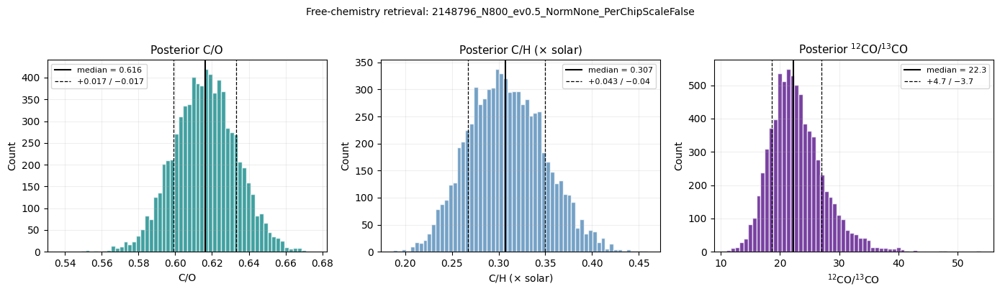

In [6]:
chem_out = run_free_chemistry_workflow(workpath=workpath, retrieval_id=retrieval_id)
print('Posterior shape:', chem_out['posterior'].shape)
print('Retrieved params:', chem_out['columns'])
display(chem_out['summary'])

print('\nText summary:')
for _, row in chem_out['summary'].iterrows():
    print(
        f"{row['parameter']}: median={row['p50']:.4g}, "
        f"1\u03c3=[-{row['minus_1sigma']:.3g}, +{row['plus_1sigma']:.3g}]"
    )

plot_free_chemistry(chem_out, retrieval_id)


### Individual species posteriors (log VMR)


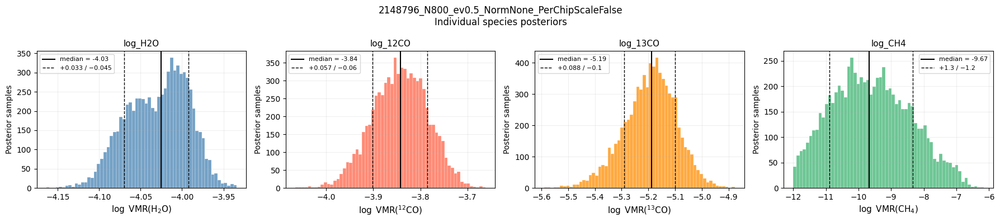

In [7]:
import pandas as pd

posterior = chem_out['posterior']
col_idx   = {k: i for i, k in enumerate(chem_out['columns'])}

species = ['log_H2O', 'log_12CO', 'log_13CO', 'log_CH4']
labels  = [r'$\log$ VMR(H$_2$O)', r'$\log$ VMR($^{12}$CO)',
           r'$\log$ VMR($^{13}$CO)', r'$\log$ VMR(CH$_4$)']
colors  = ['steelblue', 'tomato', 'darkorange', 'mediumseagreen']

fig, axes = plt.subplots(1, 4, figsize=(18, 4))
for ax, sp, lab, col in zip(axes, species, labels, colors):
    samp = posterior[:, col_idx[sp]]
    p16, p50, p84 = np.percentile(samp, [16, 50, 84])
    ax.hist(samp, bins=60, color=col, alpha=0.75, edgecolor='white', linewidth=0.3)
    ax.axvline(p50, color='k', lw=1.5, label=f'median = {p50:.3g}')
    ax.axvline(p16, color='k', lw=1.0, ls='--')
    ax.axvline(p84, color='k', lw=1.0, ls='--',
               label=f'+{p84-p50:.2g} / \u2212{p50-p16:.2g}')
    ax.set_xlabel(lab, fontsize=11)
    ax.set_ylabel('Posterior samples', fontsize=10)
    ax.set_title(sp, fontsize=11)
    ax.legend(fontsize=8)
    ax.grid(alpha=0.2)

fig.suptitle(f'{retrieval_id}\nIndividual species posteriors', fontsize=12)
plt.tight_layout()
plt.show()


### Derived log_g, M, R posteriors


log_g (derived): 3.637 +0.041 / -0.049
  → g = 4335 cm/s²


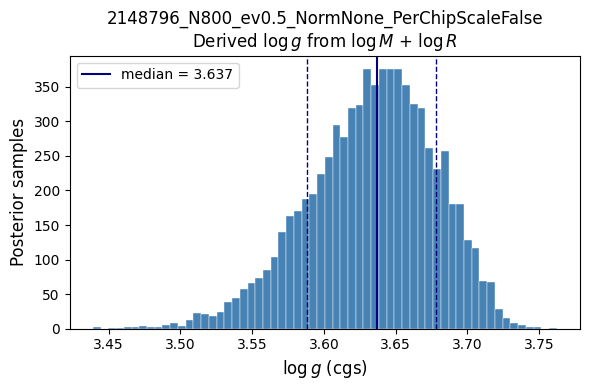

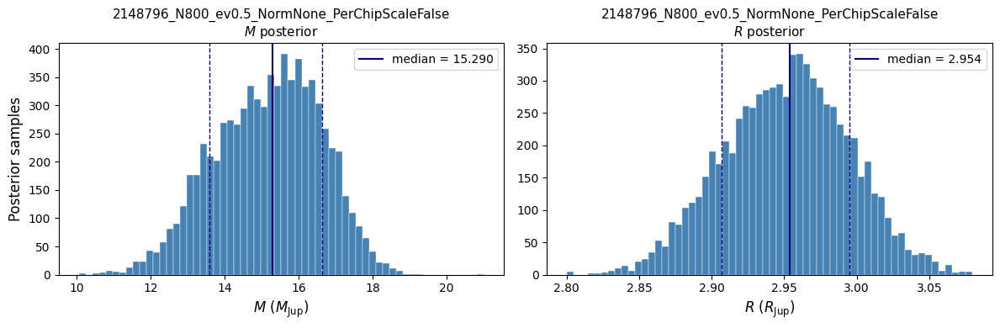

In [8]:
# log_g (cgs) = log10( G * M / R^2 ), G = 6.674e-8 cgs
# log_M in log10(M_Jup), log_R in log10(R_Jup)
# M_Jup = 1.898e30 g, R_Jup = 7.149e9 cm

log_M_samp = posterior[:, col_idx['log_M']]
log_R_samp = posterior[:, col_idx['log_R']]

G_cgs    = 6.674e-8
M_JUP_G  = 1.898e30
R_JUP_CM = 7.149e9

M_g  = 10**log_M_samp * M_JUP_G
R_cm = 10**log_R_samp * R_JUP_CM
log_g_derived = np.log10(G_cgs * M_g / R_cm**2)

p16, p50, p84 = np.percentile(log_g_derived, [16, 50, 84])
print(f'log_g (derived): {p50:.3f} +{p84-p50:.3f} / -{p50-p16:.3f}')
print(f'  \u2192 g = {10**p50:.0f} cm/s\u00b2')

fig, ax = plt.subplots(figsize=(6, 4))
ax.hist(log_g_derived, bins=60, color='steelblue', edgecolor='white', linewidth=0.3)
ax.axvline(p50, color='navy', lw=1.5, label=f'median = {p50:.3f}')
ax.axvline(p16, color='navy', lw=1.0, ls='--')
ax.axvline(p84, color='navy', lw=1.0, ls='--')
ax.set_xlabel(r'$\log g$ (cgs)', fontsize=12)
ax.set_ylabel('Posterior samples', fontsize=12)
ax.set_title(f'{retrieval_id}\nDerived $\\log g$ from $\\log M$ + $\\log R$')
ax.legend(fontsize=10)
plt.tight_layout()
plt.show()

p16_M, p50_M, p84_M = np.percentile(M_g / M_JUP_G, [16, 50, 84])
p16_R, p50_R, p84_R = np.percentile(R_cm / R_JUP_CM, [16, 50, 84])

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(M_g / M_JUP_G, bins=60, color='steelblue', edgecolor='white', linewidth=0.3)
axes[1].hist(R_cm / R_JUP_CM, bins=60, color='steelblue', edgecolor='white', linewidth=0.3)

axes[0].axvline(p50_M, color='navy', lw=1.5, label=f'median = {p50_M:.3f}')
axes[0].axvline(p16_M, color='navy', lw=1.0, ls='--')
axes[0].axvline(p84_M, color='navy', lw=1.0, ls='--')
axes[1].axvline(p50_R, color='navy', lw=1.5, label=f'median = {p50_R:.3f}')
axes[1].axvline(p16_R, color='navy', lw=1.0, ls='--')
axes[1].axvline(p84_R, color='navy', lw=1.0, ls='--')

axes[0].set_xlabel(r'$M$ ($M_{\rm Jup}$)', fontsize=12)
axes[1].set_xlabel(r'$R$ ($R_{\rm Jup}$)', fontsize=12)
axes[0].set_ylabel('Posterior samples', fontsize=12)
axes[0].set_title(f'{retrieval_id}\n$M$ posterior', fontsize=11)
axes[1].set_title(f'{retrieval_id}\n$R$ posterior', fontsize=11)
for ax in axes:
    ax.legend(fontsize=10)
plt.tight_layout()
plt.show()


### Binned model vs data


/data2/peng/Recipe_DH_Tau_B/analysis.py:335: RuntimeWarning: invalid value encountered in sqrt
  e_bin_vld = np.sqrt(savgol_filter(e_vld ** 2, win, pol)) / np.sqrt(win / 2)


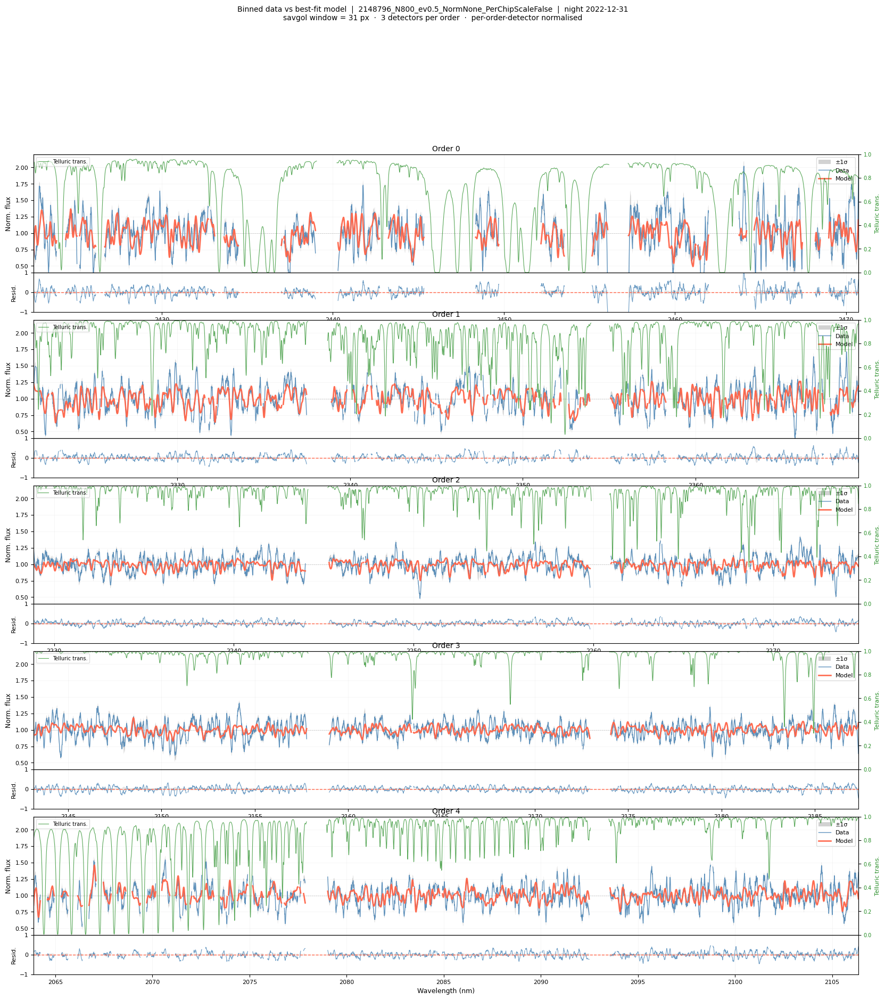

In [9]:
# Night 1 (2022-12-31)
plot_binned_model_vs_data(
    workpath=workpath,
    retrieval_id=retrieval_id,
    night='2022-12-31',
    model_wave_npy='retrieval_model_wave.npy',
    model_flux_npy='retrieval_model_flux_scaled.npy',
)


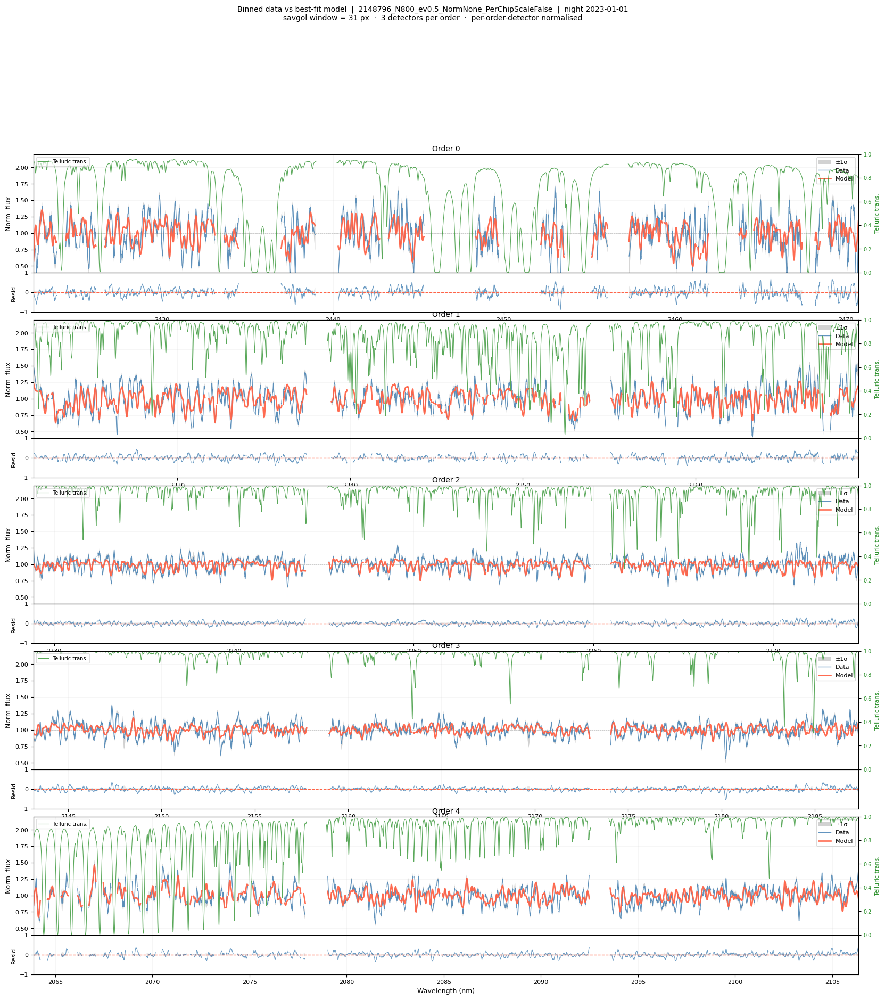

In [10]:
# Night 2 (2023-01-01)
plot_binned_model_vs_data(
    workpath=workpath,
    retrieval_id=retrieval_id,
    night='2023-01-01',
    model_wave_npy='retrieval_model_wave_N2.npy',
    model_flux_npy='retrieval_model_flux_N2.npy',
)


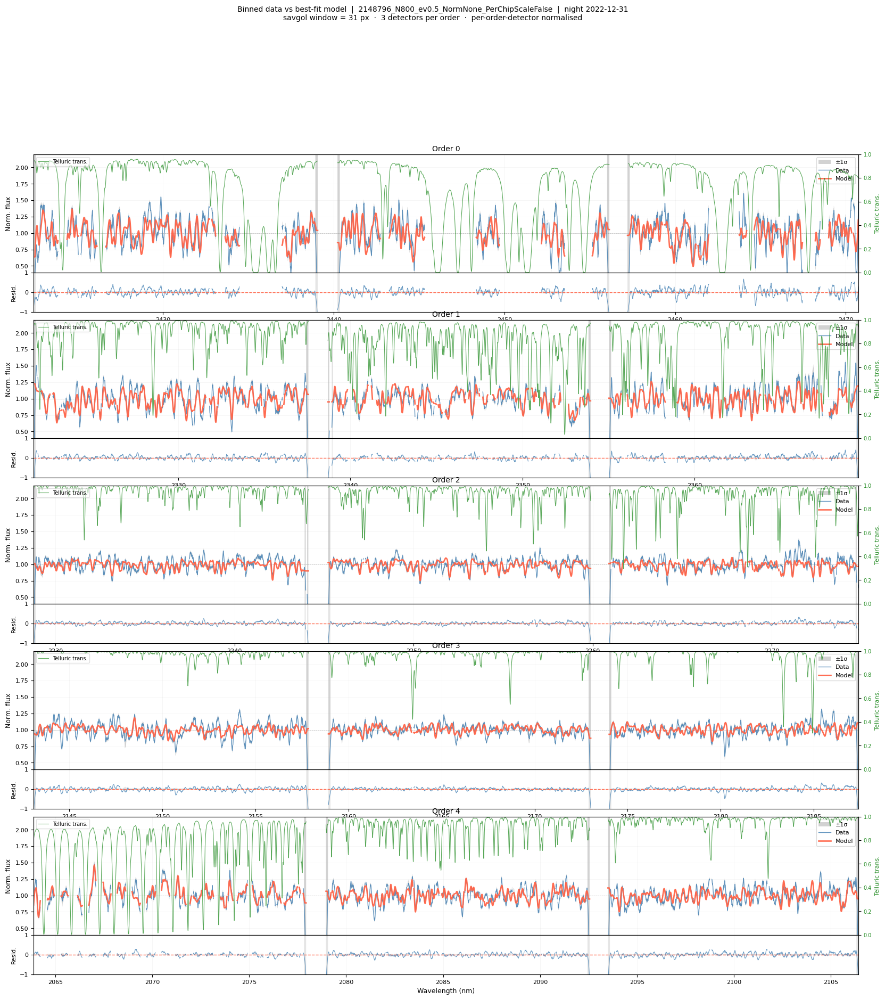

In [11]:
# Combined two-night spectrum
plot_binned_model_vs_data(
    workpath=workpath,
    retrieval_id=retrieval_id,
    night='2022-12-31',
    model_wave_npy='retrieval_model_wave.npy',
    model_flux_npy='retrieval_model_flux_scaled.npy',
    data_npy='extracted_spectra_combined_two_nights.npy',
    err_npy='extracted_spectra_combined_two_nights_err.npy',
    data_dir=workpath / 'combined_two_nights',
)


### P-T profile posterior (Piette+2020, 1σ / 2σ / 3σ bands)


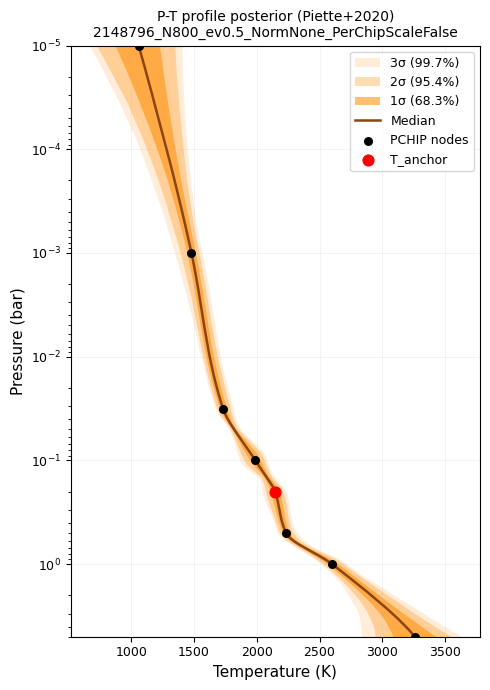

Posterior samples used: 7558
Median T range: 1058 – 3261 K


In [12]:
plot_pt_profile_piette(
    workpath=workpath,
    retrieval_id=retrieval_id,
    param_keys=_PIETTE_FREE_PARAMS_MR,
)


## Retrieval: 628541

retrieval exists: True


<>:78: SyntaxWarning: invalid escape sequence '\l'
<>:103: SyntaxWarning: invalid escape sequence '\l'
<>:104: SyntaxWarning: invalid escape sequence '\l'
<>:78: SyntaxWarning: invalid escape sequence '\l'
<>:103: SyntaxWarning: invalid escape sequence '\l'
<>:104: SyntaxWarning: invalid escape sequence '\l'
/var/tmp/peng/ipykernel_2228422/2454608107.py:78: SyntaxWarning: invalid escape sequence '\l'
  ax.set_title(f'{retrieval_id} Derived $\log g$ from $\log M$ + $\log R$ posteriors')
/var/tmp/peng/ipykernel_2228422/2454608107.py:103: SyntaxWarning: invalid escape sequence '\l'
  ax[0].set_title(f'{retrieval_id} $\log M$ posterior', fontsize=12)
/var/tmp/peng/ipykernel_2228422/2454608107.py:104: SyntaxWarning: invalid escape sequence '\l'
  ax[1].set_title(f'{retrieval_id} $\log R$ posterior', fontsize=12)


Peak SNR = 5.97 at RV = -0.0 km/s
z-score = -0.18


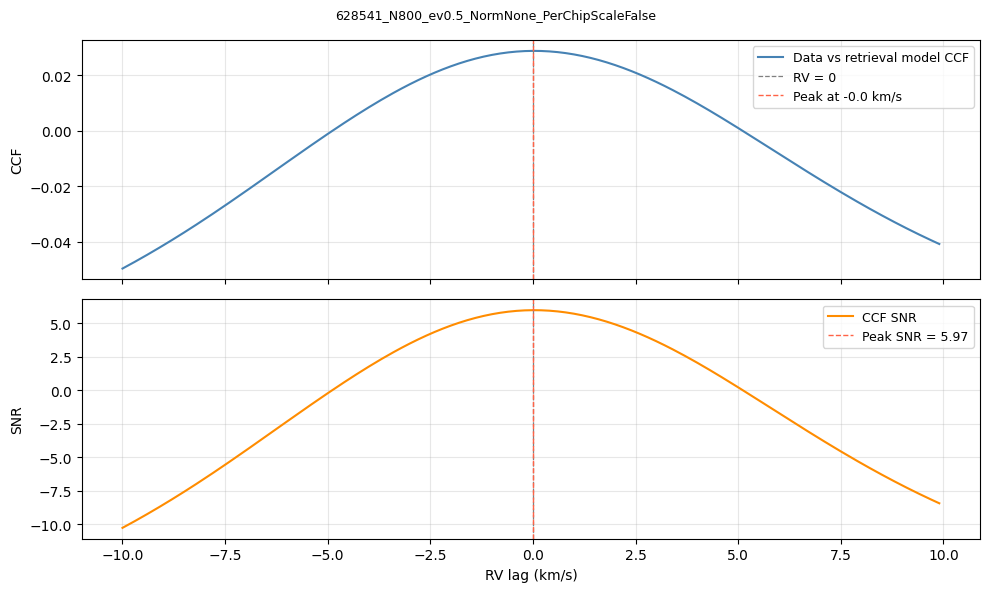

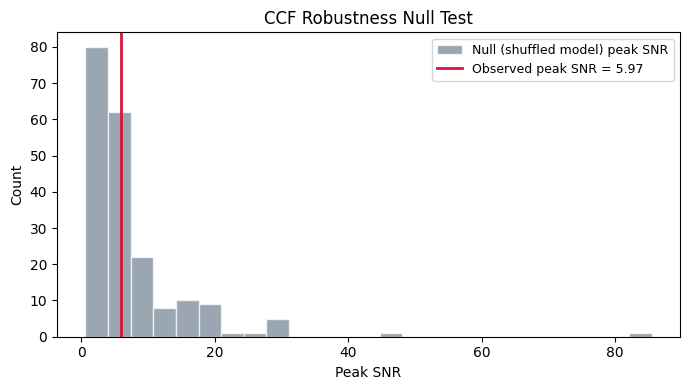

Posterior shape: (6241, 17)


,parameter,p0.135,p16,p50,p84,p99.865,minus_1sigma,plus_1sigma,minus_3sigma,plus_3sigma
0,C/O,0.515923,0.550700,0.568825,0.585673,0.620522,0.018124,0.016848,0.052902,0.051697
1,[C/H],-0.690658,-0.559330,-0.491862,-0.428237,-0.300330,0.067468,0.063625,0.198796,0.191531
2,12CO/13CO,11.728876,17.587672,21.281296,26.208821,40.180132,3.693624,4.927525,9.552420,18.898836


Text summary:
C/O: median=0.5688, 1σ=[-0.0181, +0.0168]
[C/H]: median=-0.4919, 1σ=[-0.0675, +0.0636]
12CO/13CO: median=21.28, 1σ=[-3.69, +4.93]


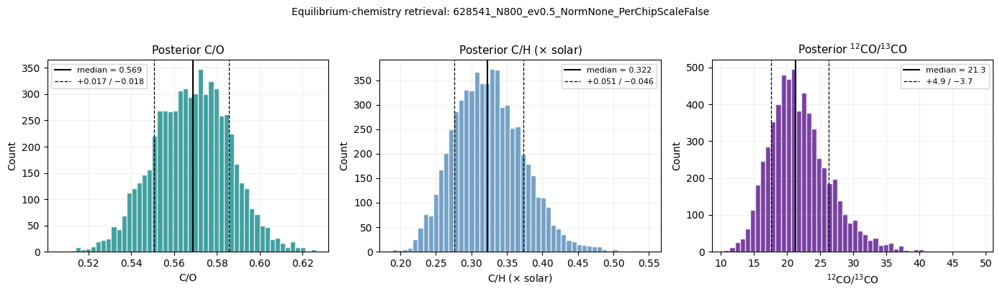

log_g (derived): 3.606 +0.030 / -0.036
  → g = 4036 cm/s²  (Xuan+2024 DH Tau b expectation: ~3.64 dex)


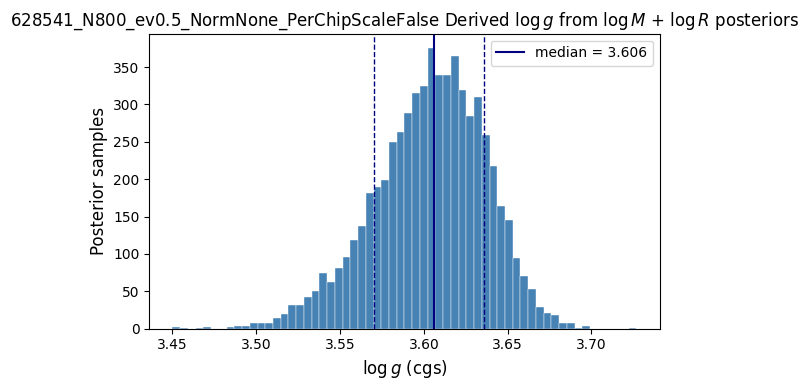

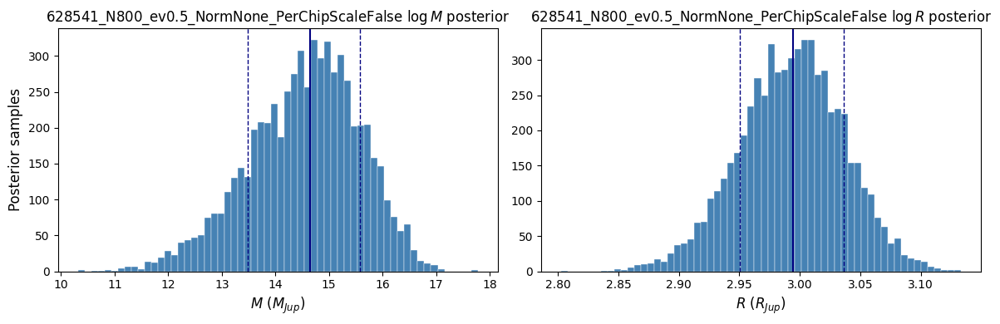

In [13]:
import sys
sys.path.insert(0, '/data2/peng/Recipe_DH_Tau_B')

from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from analysis import (
    plot_ccf, plot_equil_chemistry,
    plot_binned_model_vs_data,
    _PIETTE_EQUIL_PARAMS_MR,
    plot_pt_profile_piette,
)
from tasting_analysis import run_ccf_workflow, run_equil_chemistry_workflow

workpath     = Path('/data2/peng')
retrieval_id = '628541_N800_ev0.5_NormNone_PerChipScaleFalse'
night        = '2022-12-31'

print('retrieval exists:', (workpath / 'retrievals' / retrieval_id).exists())

ccf_out = run_ccf_workflow(
    workpath=workpath,
    retrieval_id=retrieval_id,
    night=night,
    rvlag=np.arange(-10, 10, 0.1),
    clean_grids=((-10, -1), (0, 10)),
    n_shuffle=200,
    random_seed=42,
    combined_spectrum_name='extracted_spectra_combined_flux_cal.npy',
)
print(f"Peak SNR = {ccf_out['peak_snr']:.2f} at RV = {ccf_out['peak_rv']:.1f} km/s")
print(f"z-score = {ccf_out['z_score']:.2f}")
plot_ccf(ccf_out, retrieval_id)

chem_out = run_equil_chemistry_workflow(workpath=workpath, retrieval_id=retrieval_id)
print('Posterior shape:', chem_out['posterior'].shape)
display(chem_out['summary'])
print('Text summary:')
for _, row in chem_out['summary'].iterrows():
    print(
        f"{row['parameter']}: median={row['p50']:.4g}, "
        f"1σ=[-{row['minus_1sigma']:.3g}, +{row['plus_1sigma']:.3g}]"
    )
plot_equil_chemistry(chem_out, retrieval_id)

# Derived log_g posterior from log_M and log_R samples.
# log_g (cgs) = log10( G * M / R^2 )  where G = 6.674e-8 cgs
# log_M in log10(M_Jup), log_R in log10(R_Jup)
# M_Jup = 1.898e30 g, R_Jup = 7.149e9 cm

posterior = np.load(workpath / 'retrievals' / retrieval_id / 'final_posterior.npy')
col_mr = {k: i for i, k in enumerate(_PIETTE_EQUIL_PARAMS_MR)}

log_M_samp = posterior[:, col_mr['log_M']]
log_R_samp = posterior[:, col_mr['log_R']]

G_cgs   = 6.674e-8
M_JUP_G = 1.898e30
R_JUP_CM = 7.149e9

M_g  = 10**log_M_samp * M_JUP_G
R_cm = 10**log_R_samp * R_JUP_CM
log_g_derived = np.log10(G_cgs * M_g / R_cm**2)

p16, p50, p84 = np.percentile(log_g_derived, [16, 50, 84])
print(f'log_g (derived): {p50:.3f} +{p84-p50:.3f} / -{p50-p16:.3f}')
print(f'  → g = {10**p50:.0f} cm/s²  (Xuan+2024 DH Tau b expectation: ~3.64 dex)')

fig, ax = plt.subplots(figsize=(6, 4))
ax.hist(log_g_derived, bins=60, color='steelblue', edgecolor='white', linewidth=0.3)
ax.axvline(p50, color='navy',   linewidth=1.5, label=f'median = {p50:.3f}')
ax.axvline(p16, color='navy',   linewidth=1.0, linestyle='--')
ax.axvline(p84, color='navy',   linewidth=1.0, linestyle='--')
#ax.axvline(3.643, color='tomato', linewidth=1.5, linestyle=':',
           #label='Xuan+2024 expectation (3.643)')
ax.set_xlabel(r'$\log g$ (cgs)', fontsize=12)
ax.set_ylabel('Posterior samples', fontsize=12)
ax.set_title(f'{retrieval_id} Derived $\log g$ from $\log M$ + $\log R$ posteriors')
ax.legend(fontsize=10)
plt.tight_layout()
plt.show()

#plot alos M and R posteriors converted into linear space, and show the median and 1σ intervals.
p16_M, p50_M, p84_M = np.percentile(M_g/M_JUP_G, [16, 50, 84])
p16_R, p50_R, p84_R = np.percentile(R_cm/R_JUP_CM, [16, 50, 84])


fig, ax = plt.subplots(1, 2, figsize=(12, 4))
ax[0].hist(M_g/M_JUP_G, bins=60, color='steelblue', edgecolor='white', linewidth=0.3)
ax[1].hist(R_cm/R_JUP_CM, bins=60, color='steelblue', edgecolor='white', linewidth=0.3)

ax[0].axvline(p50_M, color='navy',   linewidth=1.5, label=f'median = {p50_M:.3f}')
ax[0].axvline(p16_M, color='navy',   linewidth=1.0, linestyle='--')
ax[0].axvline(p84_M, color='navy',   linewidth=1.0, linestyle='--')
ax[1].axvline(p50_R, color='navy',   linewidth=1.5, label=f'median = {p50_R:.3f}')
ax[1].axvline(p16_R, color='navy',   linewidth=1.0, linestyle='--')
ax[1].axvline(p84_R, color='navy',   linewidth=1.0, linestyle='--')

ax[0].set_xlabel(r'$M$ ($M_{Jup}$)', fontsize=12)
ax[1].set_xlabel(r'$R$ ($R_{Jup}$)', fontsize=12)
ax[0].set_ylabel('Posterior samples', fontsize=12)

ax[0].set_title(f'{retrieval_id} $\log M$ posterior', fontsize=12)
ax[1].set_title(f'{retrieval_id} $\log R$ posterior', fontsize=12)

plt.tight_layout()
plt.show()

/data2/peng/Recipe_DH_Tau_B/analysis.py:335: RuntimeWarning: invalid value encountered in sqrt
  e_bin_vld = np.sqrt(savgol_filter(e_vld ** 2, win, pol)) / np.sqrt(win / 2)


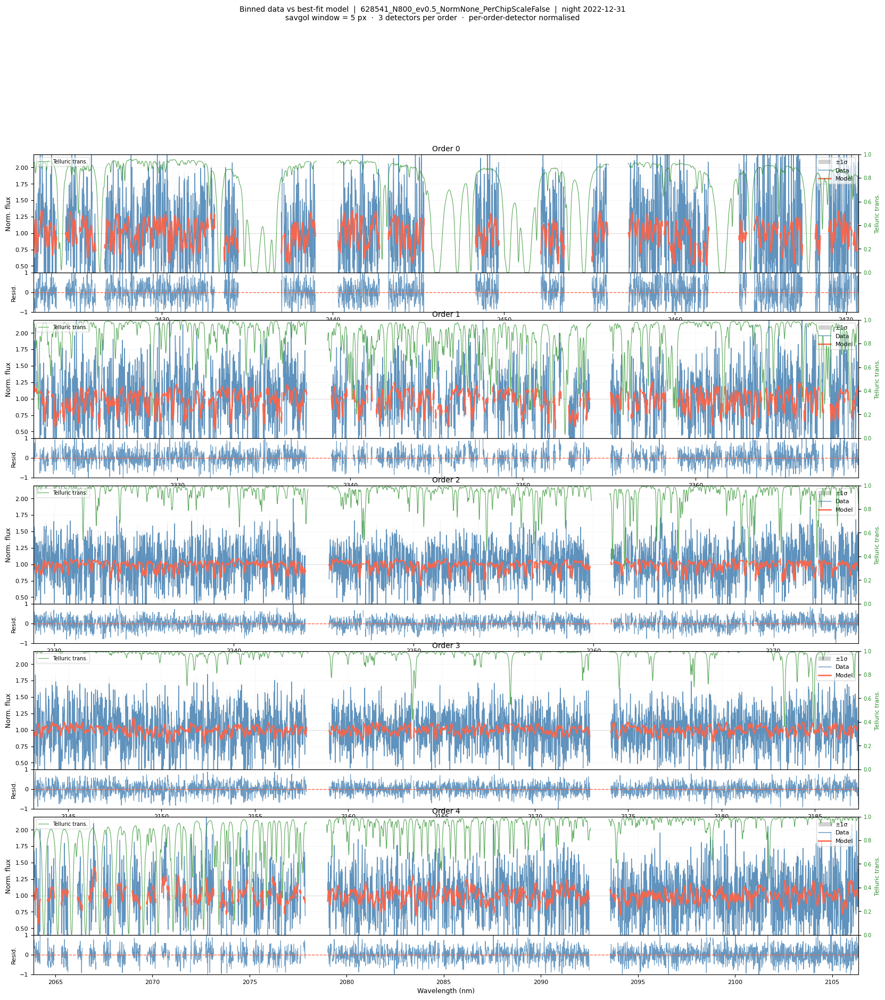

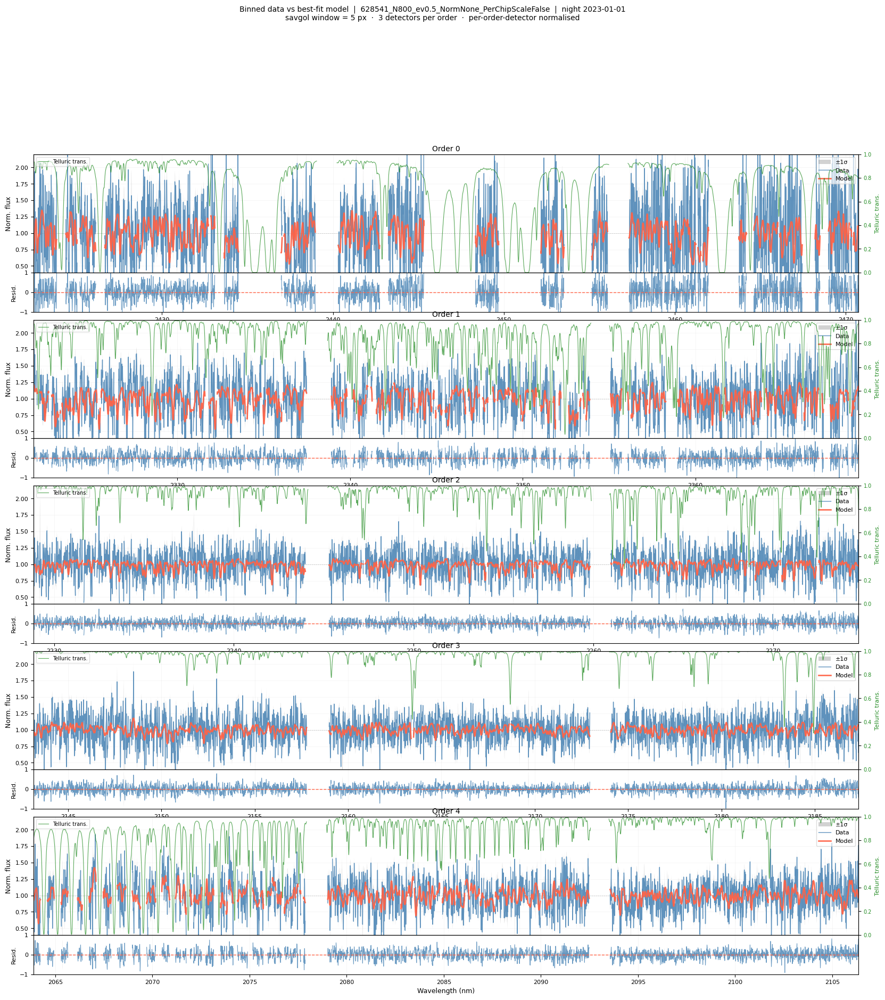

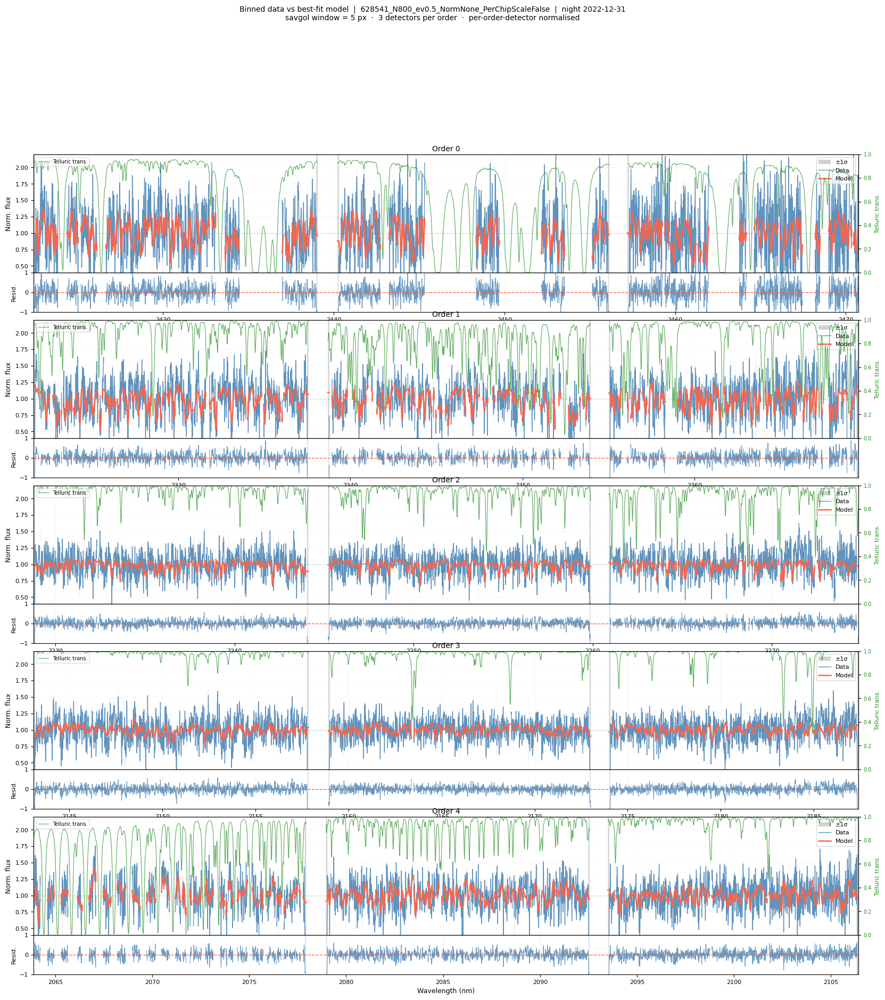

In [14]:
plot_binned_model_vs_data(
    workpath=workpath,
    retrieval_id=retrieval_id,
    night='2022-12-31',
    model_wave_npy='retrieval_model_wave.npy',
    model_flux_npy='retrieval_model_flux_scaled.npy',
    win = 5,
)

plot_binned_model_vs_data(
    workpath=workpath,
    retrieval_id=retrieval_id,
    night='2023-01-01',
    model_wave_npy='retrieval_model_wave.npy',
    model_flux_npy='retrieval_model_flux_scaled.npy',
    win = 5,
)

plot_binned_model_vs_data(
    workpath=workpath,
    retrieval_id=retrieval_id,
    night='2022-12-31',
    model_wave_npy='retrieval_model_wave.npy',
    model_flux_npy='retrieval_model_flux_scaled.npy',
    data_npy='extracted_spectra_combined_two_nights.npy',
    err_npy='extracted_spectra_combined_two_nights_err.npy',
    data_dir=workpath / 'combined_two_nights',
    win = 5,
)



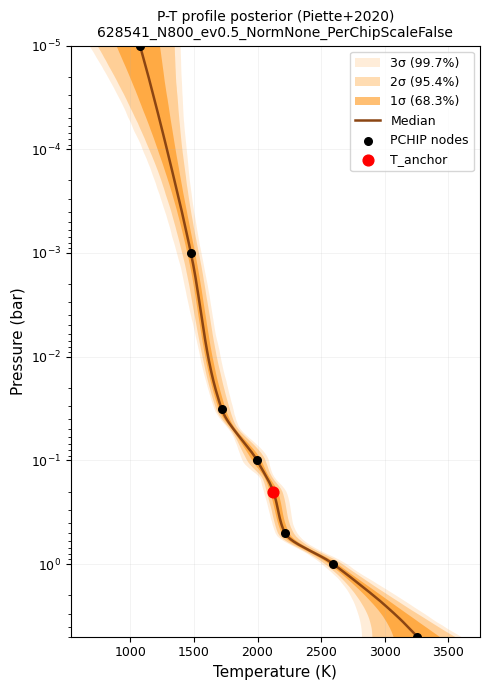

Posterior samples used: 6241
Median T range: 1074 – 3256 K


In [15]:
plot_pt_profile_piette(
    workpath=workpath,
    retrieval_id=retrieval_id,
    param_keys=_PIETTE_EQUIL_PARAMS_MR,
)

## Retrieval: 3766037

**Piette & Madhusudhan (2020) P-T Profile + Equilibrium chemistry + EddySed clouds**  
Equilibrium chemistry: C_H ([C/H]), C/O, log_12CO_13CO  
Cloud species: MgSiO3(s)_crystalline_000, Fe(s)_crystalline_000 (Ackerman & Marley 2001)  
Cloud params: log_X_MgSiO3, log_X_Fe, fsed, log_Kzz, sigma_lnorm  
P-T: T_anchor (0.2 bar) + 7 monotonic increments dT_1…dT_7 (PCHIP spline)  
Mass/radius: log_M + log_R as free parameters (log_g derived)  
Live points: N=800, ev=0.5, Norm=None, PerChipScale=False  
Two-night fit: Night 1 = 2022-12-31, Night 2 = 2023-01-01  
Series: 005PM-EQ-CLD  
Script: `tasting_retrieval_equa_chem_v5.0_piette_cloud.py`

In [16]:
from analysis import plot_equil_chemistry
from tasting_analysis import run_equil_chemistry_workflow

# Piette P-T + equilibrium chemistry + EddySed clouds (MgSiO3 + Fe)
_PIETTE_EQUIL_PARAMS_MR_CLD = [
    'rv_N1', 'rv_N2', 'vsini', 'epsilon', 'log_M', 'log_R',
    'T_anchor', 'dT_1', 'dT_2', 'dT_3', 'dT_4', 'dT_5', 'dT_6', 'dT_7',
    'C_H', 'C/O', 'log_12CO_13CO',
    'log_X_MgSiO3', 'log_X_Fe', 'fsed', 'log_Kzz', 'sigma_lnorm',
]

workpath     = Path('/data2/peng')
retrieval_id = '3766037_N800_ev0.5_NormNone_PerChipScaleFalse'
night        = '2022-12-31'

print('retrieval exists:', (workpath / 'retrievals' / retrieval_id).exists())

retrieval exists: True


### CCF robustness check

Peak SNR = 6.05 at RV = -0.0 km/s
z-score = -0.18


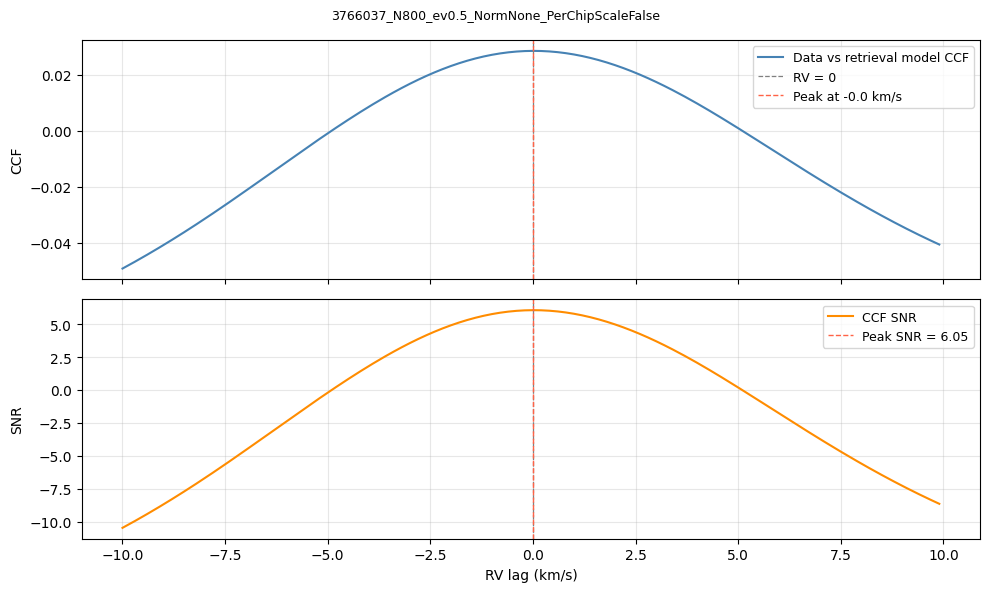

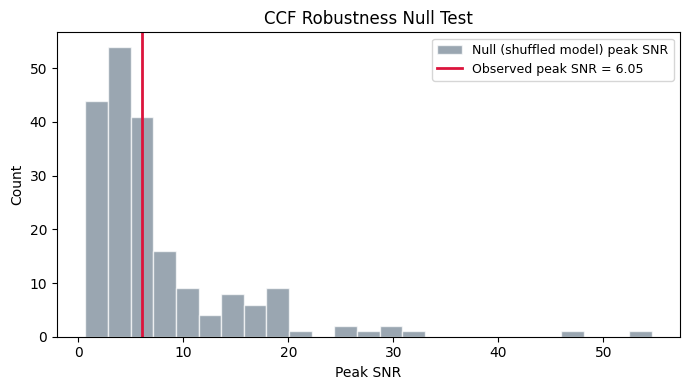

In [17]:
ccf_out = run_ccf_workflow(
    workpath=workpath,
    retrieval_id=retrieval_id,
    night=night,
    rvlag=np.arange(-10, 10, 0.1),
    clean_grids=((-10, -1), (0, 10)),
    n_shuffle=200,
    random_seed=42,
    combined_spectrum_name='extracted_spectra_combined_flux_cal.npy',
)
print(f"Peak SNR = {ccf_out['peak_snr']:.2f} at RV = {ccf_out['peak_rv']:.1f} km/s")
print(f"z-score = {ccf_out['z_score']:.2f}")
plot_ccf(ccf_out, retrieval_id)

### Equilibrium chemistry posterior diagnostics (C/O, [C/H], 12CO/13CO)

Posterior shape: (6449, 22)
Retrieved params: ['rv_N1', 'rv_N2', 'vsini', 'epsilon', 'log_M', 'log_R', 'T_anchor', 'dT_1', 'dT_2', 'dT_3', 'dT_4', 'dT_5', 'dT_6', 'dT_7', 'C_H', 'C/O', 'log_12CO_13CO', 'log_X_MgSiO3', 'log_X_Fe', 'fsed', 'log_Kzz', 'sigma_lnorm']


,parameter,p0.135,p16,p50,p84,p99.865,minus_1sigma,plus_1sigma,minus_3sigma,plus_3sigma
0,C/O,0.536227,0.582415,0.597536,0.611928,0.645362,0.015121,0.014392,0.061309,0.047826
1,[C/H],-0.635517,-0.517626,-0.463041,-0.399246,-0.255568,0.054585,0.063795,0.172476,0.207474
2,12CO/13CO,12.368773,18.650542,22.570129,27.183696,41.764692,3.919587,4.613566,10.201356,19.194563



Text summary:
C/O: median=0.5975, 1σ=[-0.0151, +0.0144]
[C/H]: median=-0.463, 1σ=[-0.0546, +0.0638]
12CO/13CO: median=22.57, 1σ=[-3.92, +4.61]


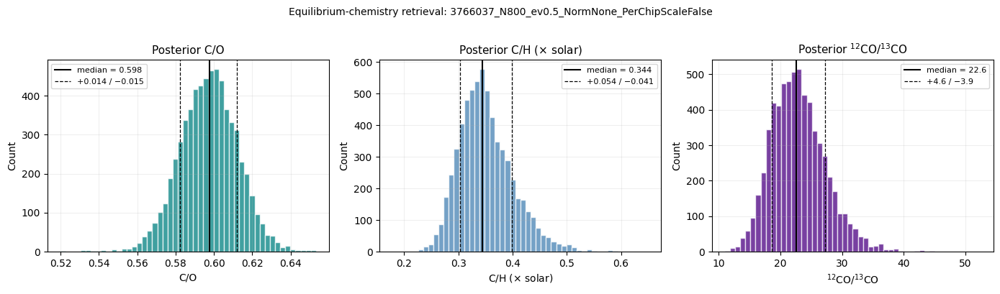

In [18]:
chem_out = run_equil_chemistry_workflow(workpath=workpath, retrieval_id=retrieval_id)
print('Posterior shape:', chem_out['posterior'].shape)
print('Retrieved params:', chem_out['columns'])
display(chem_out['summary'])

print('\nText summary:')
for _, row in chem_out['summary'].iterrows():
    print(
        f"{row['parameter']}: median={row['p50']:.4g}, "
        f"1σ=[-{row['minus_1sigma']:.3g}, +{row['plus_1sigma']:.3g}]"
    )

plot_equil_chemistry(chem_out, retrieval_id)

### Cloud parameter posteriors

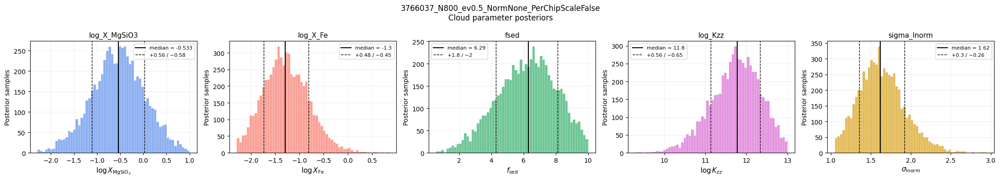

In [19]:
posterior = chem_out['posterior']
col_idx   = {k: i for i, k in enumerate(chem_out['columns'])}

cloud_params = ['log_X_MgSiO3', 'log_X_Fe', 'fsed', 'log_Kzz', 'sigma_lnorm']
cloud_labels = [
    r'$\log X_{\rm MgSiO_3}$', r'$\log X_{\rm Fe}$',
    r'$f_{\rm sed}$', r'$\log K_{zz}$', r'$\sigma_{\rm lnorm}$',
]
cloud_colors = ['cornflowerblue', 'salmon', 'mediumseagreen', 'orchid', 'goldenrod']

fig, axes = plt.subplots(1, 5, figsize=(22, 4))
for ax, param, label, color in zip(axes, cloud_params, cloud_labels, cloud_colors):
    if param not in col_idx:
        ax.set_visible(False)
        continue
    samp = posterior[:, col_idx[param]]
    p16, p50, p84 = np.percentile(samp, [16, 50, 84])
    ax.hist(samp, bins=60, color=color, alpha=0.75, edgecolor='white', linewidth=0.3)
    ax.axvline(p50, color='k', lw=1.5, label=f'median = {p50:.3g}')
    ax.axvline(p16, color='k', lw=1.0, ls='--')
    ax.axvline(p84, color='k', lw=1.0, ls='--',
               label=f'+{p84-p50:.2g} / \u2212{p50-p16:.2g}')
    ax.set_xlabel(label, fontsize=11)
    ax.set_ylabel('Posterior samples', fontsize=10)
    ax.set_title(param, fontsize=11)
    ax.legend(fontsize=8)
    ax.grid(alpha=0.2)

fig.suptitle(f'{retrieval_id}\nCloud parameter posteriors', fontsize=12)
plt.tight_layout()
plt.show()

### Derived log_g, M, R posteriors

log_g (derived): 3.512 +0.041 / -0.034
  → g = 3250 cm/s²


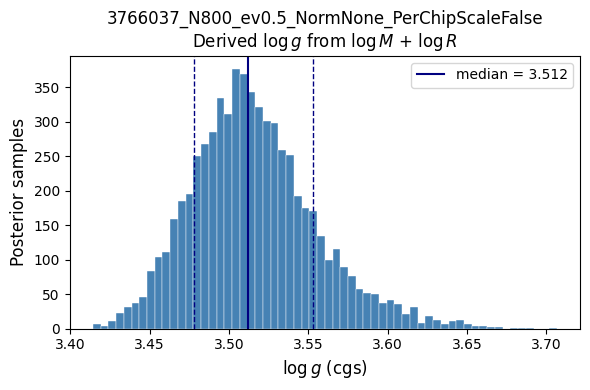

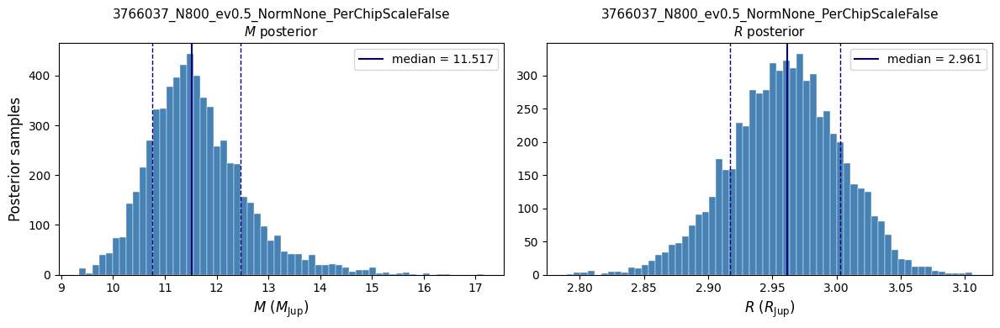

In [20]:
log_M_samp = posterior[:, col_idx['log_M']]
log_R_samp = posterior[:, col_idx['log_R']]

G_cgs    = 6.674e-8
M_JUP_G  = 1.898e30
R_JUP_CM = 7.149e9

M_g  = 10**log_M_samp * M_JUP_G
R_cm = 10**log_R_samp * R_JUP_CM
log_g_derived = np.log10(G_cgs * M_g / R_cm**2)

p16, p50, p84 = np.percentile(log_g_derived, [16, 50, 84])
print(f'log_g (derived): {p50:.3f} +{p84-p50:.3f} / -{p50-p16:.3f}')
print(f'  \u2192 g = {10**p50:.0f} cm/s\u00b2')

fig, ax = plt.subplots(figsize=(6, 4))
ax.hist(log_g_derived, bins=60, color='steelblue', edgecolor='white', linewidth=0.3)
ax.axvline(p50, color='navy', lw=1.5, label=f'median = {p50:.3f}')
ax.axvline(p16, color='navy', lw=1.0, ls='--')
ax.axvline(p84, color='navy', lw=1.0, ls='--')
ax.set_xlabel(r'$\log g$ (cgs)', fontsize=12)
ax.set_ylabel('Posterior samples', fontsize=12)
ax.set_title(f'{retrieval_id}\nDerived $\\log g$ from $\\log M$ + $\\log R$')
ax.legend(fontsize=10)
plt.tight_layout()
plt.show()

p16_M, p50_M, p84_M = np.percentile(M_g / M_JUP_G, [16, 50, 84])
p16_R, p50_R, p84_R = np.percentile(R_cm / R_JUP_CM, [16, 50, 84])

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(M_g / M_JUP_G, bins=60, color='steelblue', edgecolor='white', linewidth=0.3)
axes[1].hist(R_cm / R_JUP_CM, bins=60, color='steelblue', edgecolor='white', linewidth=0.3)

axes[0].axvline(p50_M, color='navy', lw=1.5, label=f'median = {p50_M:.3f}')
axes[0].axvline(p16_M, color='navy', lw=1.0, ls='--')
axes[0].axvline(p84_M, color='navy', lw=1.0, ls='--')
axes[1].axvline(p50_R, color='navy', lw=1.5, label=f'median = {p50_R:.3f}')
axes[1].axvline(p16_R, color='navy', lw=1.0, ls='--')
axes[1].axvline(p84_R, color='navy', lw=1.0, ls='--')

axes[0].set_xlabel(r'$M$ ($M_{\rm Jup}$)', fontsize=12)
axes[1].set_xlabel(r'$R$ ($R_{\rm Jup}$)', fontsize=12)
axes[0].set_ylabel('Posterior samples', fontsize=12)
axes[0].set_title(f'{retrieval_id}\n$M$ posterior', fontsize=11)
axes[1].set_title(f'{retrieval_id}\n$R$ posterior', fontsize=11)
for ax in axes:
    ax.legend(fontsize=10)
plt.tight_layout()
plt.show()

### Binned model vs data

/data2/peng/Recipe_DH_Tau_B/analysis.py:335: RuntimeWarning: invalid value encountered in sqrt
  e_bin_vld = np.sqrt(savgol_filter(e_vld ** 2, win, pol)) / np.sqrt(win / 2)


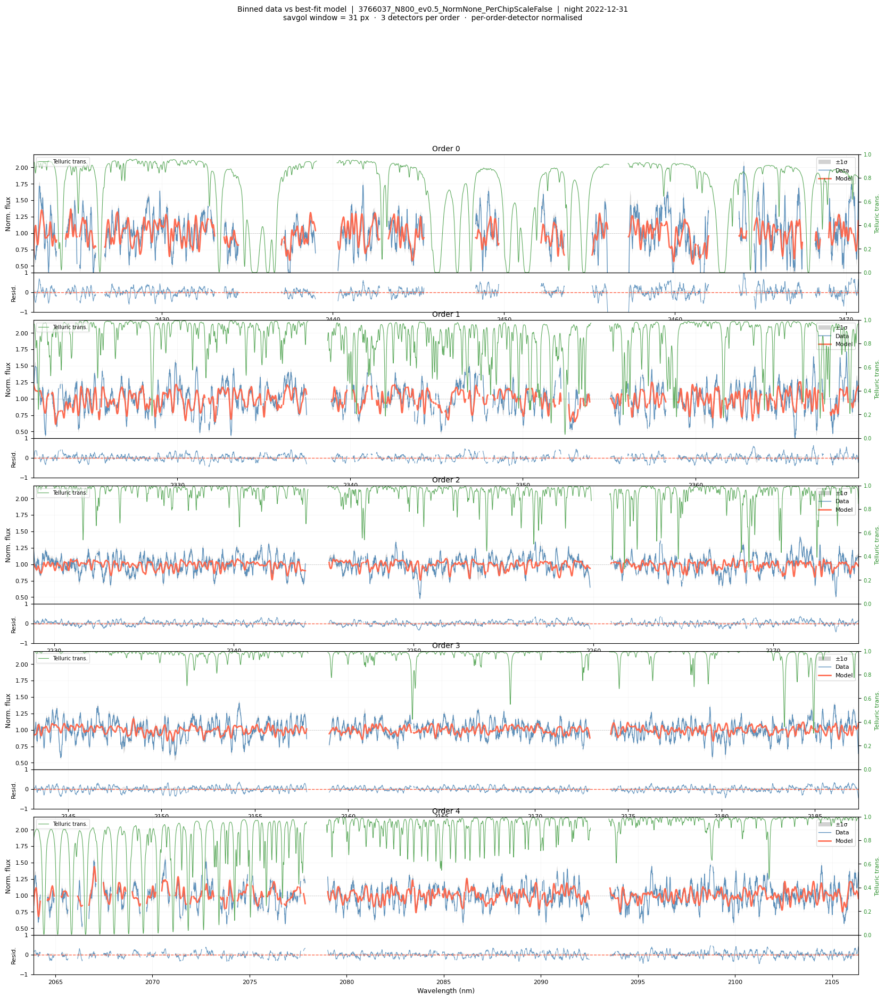

In [21]:
# Night 1 (2022-12-31)
plot_binned_model_vs_data(
    workpath=workpath,
    retrieval_id=retrieval_id,
    night='2022-12-31',
    model_wave_npy='retrieval_model_wave.npy',
    model_flux_npy='retrieval_model_flux_scaled.npy',
)

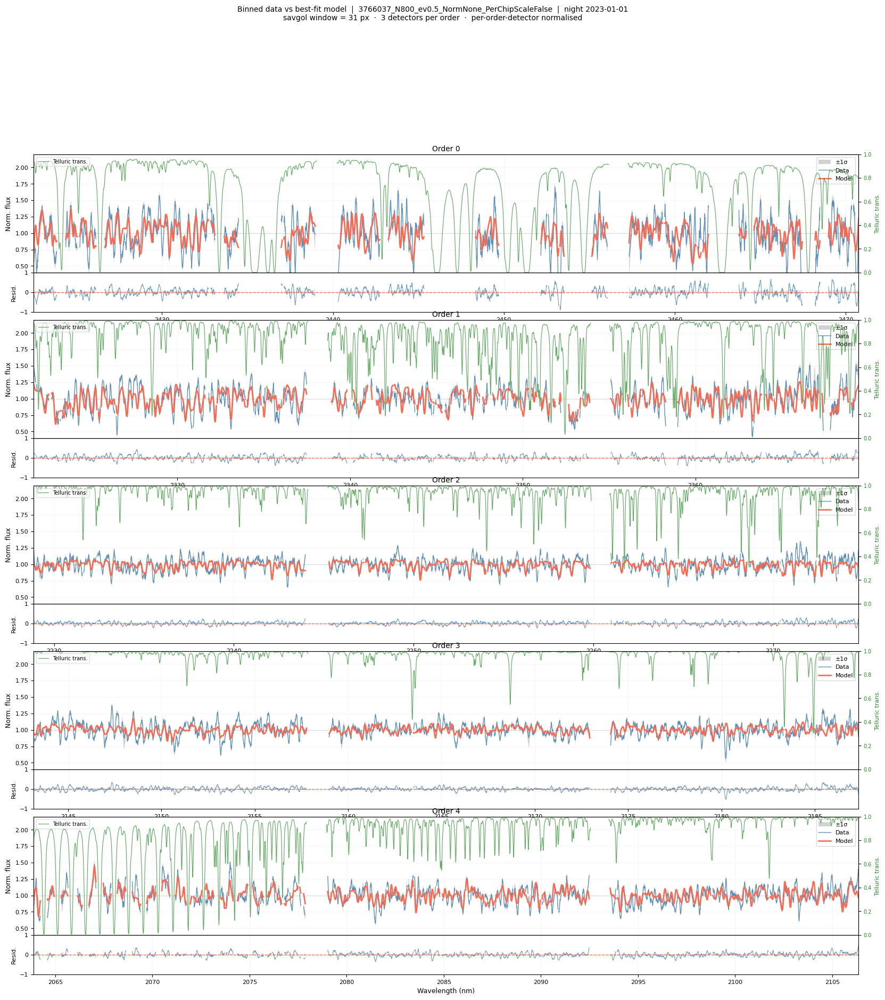

In [22]:
# Night 2 (2023-01-01)
plot_binned_model_vs_data(
    workpath=workpath,
    retrieval_id=retrieval_id,
    night='2023-01-01',
    model_wave_npy='retrieval_model_wave_N2.npy',
    model_flux_npy='retrieval_model_flux_N2.npy',
)

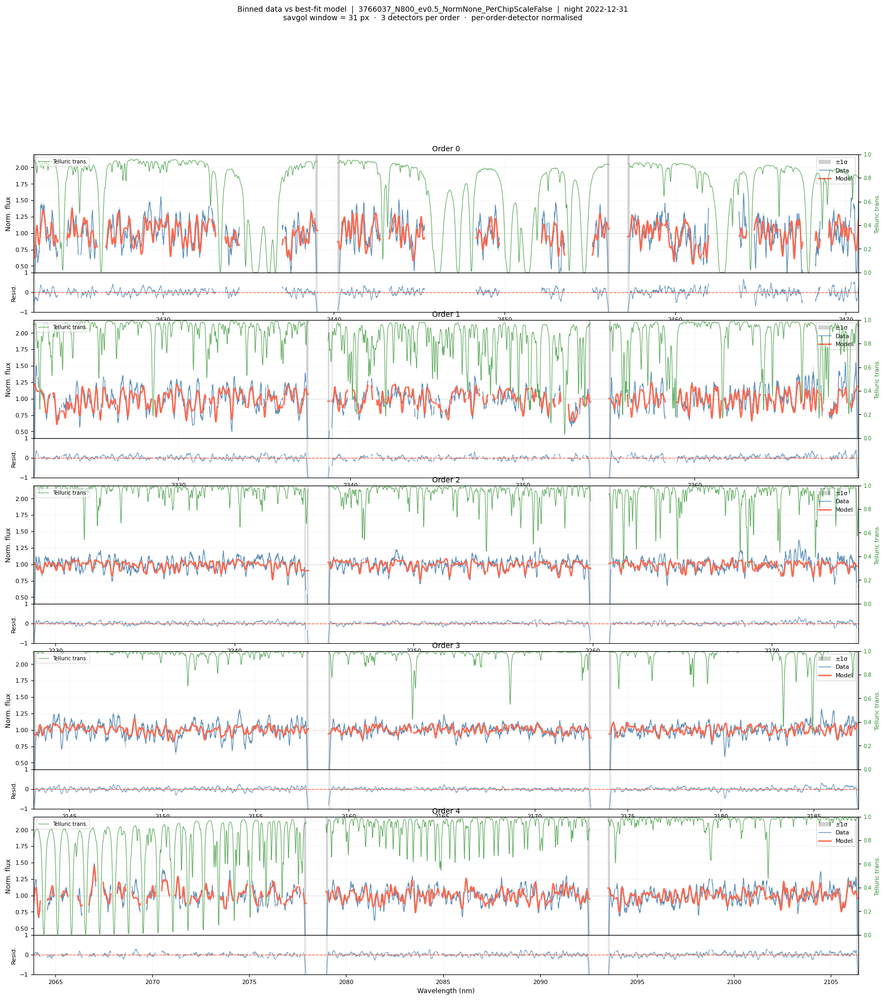

In [23]:
plot_binned_model_vs_data(
    workpath=workpath,
    retrieval_id=retrieval_id,
    night='2022-12-31',
    model_wave_npy='retrieval_model_wave.npy',
    model_flux_npy='retrieval_model_flux_scaled.npy',
    data_npy='extracted_spectra_combined_two_nights.npy',
    err_npy='extracted_spectra_combined_two_nights_err.npy',
    data_dir=workpath / 'combined_two_nights',
)


### P-T profile posterior (Piette+2020, 1σ / 2σ / 3σ bands)

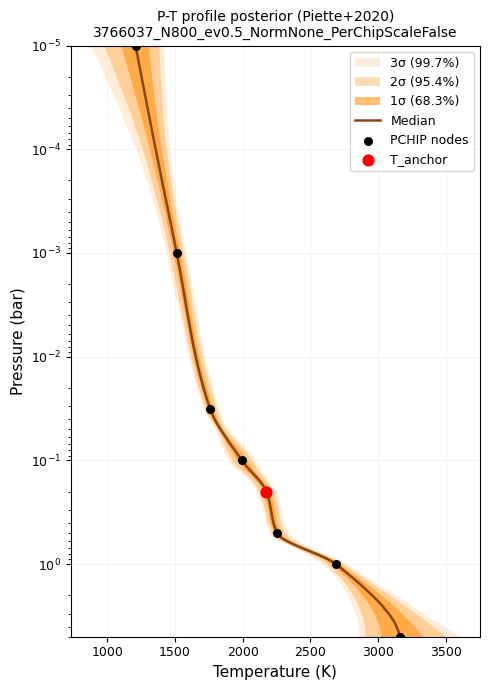

Posterior samples used: 6449
Median T range: 1209 – 3161 K


In [24]:
plot_pt_profile_piette(
    workpath=workpath,
    retrieval_id=retrieval_id,
    param_keys=_PIETTE_EQUIL_PARAMS_MR_CLD,
)

---

## Cross-retrieval comparison: C/O, [C/H], ¹²CO/¹³CO

Overlapping posteriors for three retrieval configurations:

| Label | Retrieval ID | Chemistry | Clouds |
|-------|-------------|-----------|--------|
| 005PM-EQ (628541) | `628541_N800_ev0.5_NormNone_PerChipScaleFalse` | Equilibrium | Cloud-free |
| 005PM-FR (2148796) | `2148796_N800_ev0.5_NormNone_PerChipScaleFalse` | Free | Cloud-free |
| 005PM-EQ-CLD (3766037) | `3766037_N800_ev0.5_NormNone_PerChipScaleFalse` | Equilibrium | EddySed |


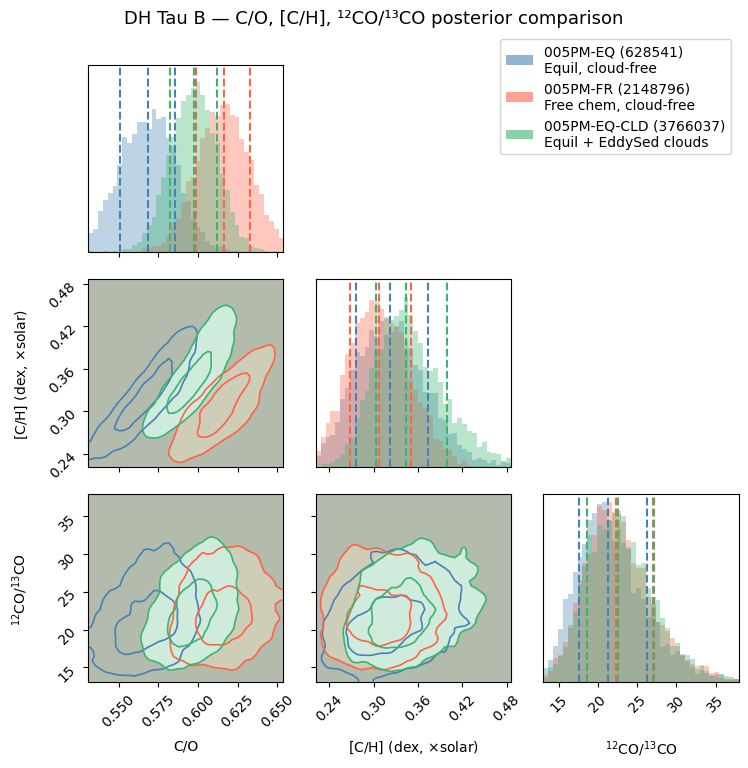

Retrieval                                          C/O                   [C/H]               12CO/13CO
--------------------------------------------------------------------------------------------------------
005PM-EQ (628541)                  0.569 +0.017/-0.018     0.322 +0.051/-0.046    21.281 +4.928/-3.694
005PM-FR (2148796)                 0.616 +0.017/-0.017     0.307 +0.043/-0.040    22.298 +4.728/-3.732
005PM-EQ-CLD (3766037)             0.598 +0.014/-0.015     0.344 +0.054/-0.041    22.570 +4.614/-3.920


In [25]:
import sys
sys.path.insert(0, '/data2/peng/Recipe_DH_Tau_B')
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import corner
from tasting_analysis import run_equil_chemistry_workflow, run_free_chemistry_workflow

workpath = Path('/data2/peng')

# ── Load posteriors ────────────────────────────────────────────────────────────
r_eq  = run_equil_chemistry_workflow(workpath, '628541_N800_ev0.5_NormNone_PerChipScaleFalse')
r_fr  = run_free_chemistry_workflow (workpath, '2148796_N800_ev0.5_NormNone_PerChipScaleFalse')
r_cld = run_equil_chemistry_workflow(workpath, '3766037_N800_ev0.5_NormNone_PerChipScaleFalse')

labels = [r'C/O', r'[C/H] (dex, $\times$solar)', r'$^{12}$CO/$^{13}$CO']

retrievals = [
    dict(label='005PM-EQ (628541)\nEquil, cloud-free',
         samples=np.column_stack([r_eq['co_samples'],
                                  10**r_eq['ch_samples'],
                                  r_eq['c12c13_samples']]),
         color='steelblue'),
    dict(label='005PM-FR (2148796)\nFree chem, cloud-free',
         samples=np.column_stack([r_fr['co_samples'],
                                  10**r_fr['ch_xsolar_samples'],
                                  r_fr['c12c13_samples']]),
         color='tomato'),
    dict(label='005PM-EQ-CLD (3766037)\nEquil + EddySed clouds',
         samples=np.column_stack([r_cld['co_samples'],
                                  10**r_cld['ch_samples'],
                                  r_cld['c12c13_samples']]),
         color='mediumseagreen'),
]

# Axis ranges from combined 0.5-99.5 percentiles
all_samples = np.vstack([r['samples'] for r in retrievals])
ranges = [
    (np.percentile(all_samples[:, i], 0.5),
     np.percentile(all_samples[:, i], 99.5))
    for i in range(3)
]

QUANTILES = [0.16, 0.5, 0.84]
LEVELS    = [1 - np.exp(-0.5), 1 - np.exp(-2.0)]   # 1sigma and 2sigma filled contours

# ── Overlapping corner plot ────────────────────────────────────────────────────
fig = None
for ret in retrievals:
    fig = corner.corner(
        ret['samples'],
        fig=fig,
        labels=labels,
        range=ranges,
        quantiles=QUANTILES,
        show_titles=False,
        color=ret['color'],
        plot_datapoints=False,
        plot_density=False,
        fill_contours=True,
        levels=LEVELS,
        contourf_kwargs=dict(alpha=0.25),
        contour_kwargs=dict(linewidths=1.2),
        hist_kwargs=dict(histtype='stepfilled', alpha=0.35, linewidth=1.4, density=True),
        smooth=1.0,
        bins=40,
    )

handles = [
    mpatches.Patch(facecolor=ret['color'], alpha=0.6, label=ret['label'])
    for ret in retrievals
]
fig.legend(handles=handles, loc='upper right',
           bbox_to_anchor=(0.98, 0.98), fontsize=10, framealpha=0.85)
fig.suptitle('DH Tau B — C/O, [C/H], ¹²CO/¹³CO posterior comparison',
             fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

# ── Numerical summary ──────────────────────────────────────────────────────────
print(f"{'Retrieval':<30}  {'C/O':>22}  {'[C/H]':>22}  {'12CO/13CO':>22}")
print('-' * 104)
rows = [
    ('005PM-EQ (628541)',       r_eq ['co_samples'],  10**r_eq ['ch_samples'],        r_eq ['c12c13_samples']),
    ('005PM-FR (2148796)',      r_fr ['co_samples'],  10**r_fr ['ch_xsolar_samples'], r_fr ['c12c13_samples']),
    ('005PM-EQ-CLD (3766037)',  r_cld['co_samples'],  10**r_cld['ch_samples'],        r_cld['c12c13_samples']),
]
for name, co, ch, c13 in rows:
    def fmt(s):
        p16, p50, p84 = np.percentile(s, [16, 50, 84])
        return f'{p50:.3f} +{p84-p50:.3f}/-{p50-p16:.3f}'
    print(f'{name:<30}  {fmt(co):>22}  {fmt(ch):>22}  {fmt(c13):>22}')
